# 12 Analysis Pipeline 
* KI excluding suspicious slides: **`N07_C1, N06_D2`**
* using new AB index

**Objectives:**
* don't use test data for feature selection step
* perhaps more narrow hyperparameter distributions

In [1]:
import pandas as pd
import numpy as np
import os
import gc
import pickle
import itertools

from numpy import ma  # masked array
from pandas.plotting import parallel_coordinates, andrews_curves, radviz

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

from scipy.stats.distributions import uniform as sp_uni, randint as sp_int

import seaborn as sns

from boruta import BorutaPy

from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, ShuffleSplit
from sklearn.ensemble.partial_dependence import partial_dependence, plot_partial_dependence
from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline

from umap import UMAP

import lime 
from lime.lime_tabular import LimeTabularExplainer

import sklearn.datasets
from lime.lime_tabular import LimeTabularExplainer

sns.set(style="whitegrid")

In [2]:
class EarlyStopMonitor:

    def __init__(self, window_length=25):
        self.window_length = window_length

    def window_boundaries(self, current_round):        
        lo = max(0, current_round - self.window_length + 1)
        hi = current_round + 1

        return lo, hi

    def __call__(self, current_round, regressor, _):        
        if current_round >= self.window_length - 1:
            lo, hi = self.window_boundaries(current_round)
            
            do_stop = np.mean(regressor.oob_improvement_[lo: hi]) < 0
            
            if do_stop:
                print('stopped after rounds: {}'.format(current_round))
            
            return do_stop
        else:
            return False

* See: https://xkcd.com/color/rgb/

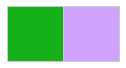

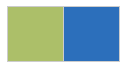

In [402]:
def xkcd_palette(colors):    
    return sns.color_palette([sns.xkcd_rgb[color] for color in colors])
    return ListedColormap(palette)

def xkcd_cm(colors):
    return ListedColormap(xkcd_palette(colors))

GrLi_p = xkcd_palette(['green', 'lilac'])
GrLi = xkcd_cm(['green', 'lilac'])

BuOl_p = xkcd_palette(["light olive", "medium blue"])
BuOl = xkcd_cm(["light olive", "medium blue"])

sns.palplot(GrLi_p)
plt.show()

sns.palplot(BuOl_p)
plt.show()

---

# Load the data

In [3]:
results_wd = '12_results/'

In [4]:
wd = '/media/tmo/data/work/datasets/02_ST'

logcpm_path = wd + '/ashley_21.03.2018/logcpm_merge_20180212.pickle'
meta_path = wd + '/meta/meta.parquet'

In [5]:
%%time
meta_df = pd.read_parquet(meta_path)

CPU times: user 185 ms, sys: 98.1 ms, total: 283 ms
Wall time: 205 ms


In [6]:
%%time
logcpm_df = pickle.load(open(logcpm_path, "rb"))

logcpm_df.index.name = 'spot_UID'
logcpm_df.reset_index(inplace=True)
logcpm_df.rename(columns={'sampleID': 'slide_ID'}, inplace=True)

CPU times: user 15.8 s, sys: 6.51 s, total: 22.4 s
Wall time: 22.3 s


In [7]:
st_df = logcpm_df.merge(meta_df, how='inner', on=['spot_UID', 'slide_ID'])

In [8]:
st_df['slide_ID'] = st_df['slide_ID'].astype('category', copy=False)
st_df['GT']       = st_df['GT'].astype('category', copy=False)
st_df['age']      = st_df['age'].astype('category', copy=False)
st_df['age_GT']   = st_df['age_GT'].astype('category', copy=False)

In [9]:
n_genes = 46454
gene_columns = st_df.columns[1:n_genes+1]

* merge with satellite tables

In [10]:
region_levels_df = pd.read_csv('region_levels.csv', sep=',', keep_default_na=False)

In [11]:
meta_data_path = 'final_metadata_scores_27_04_2018.tsv'

In [12]:
final_meta_df = pd.read_csv(meta_data_path, sep='\t', index_col=0)
final_meta_df.index.name = 'spot_UID'
final_meta_df.reset_index(inplace=True)
final_meta_df = final_meta_df[final_meta_df['AB'].notna()][['spot_UID', 'AB']]

### Log transform AB index
* the AB index is very skewed, this is not ideal for ML algorithm to regress upon
* use a masked array to compute natural log of AB index

cfr. **Jaak Simm**:
> if it is not transformed, the skewness will result in the fact that larger (absolute) deviations will be focused by the model
so lot of focus will be put into these high end values

In [13]:
final_meta_df['log_AB'] = ma.log(final_meta_df['AB'].as_matrix())

* let's check the distributions after log transform
* much nicer (Gaussian-like)
* there is some bimodality going on (could be batch effect, to investigate)

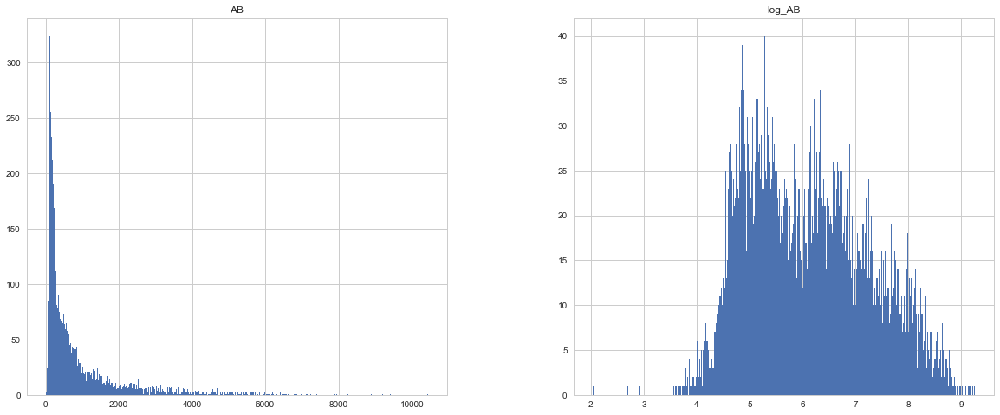

In [14]:
final_meta_df[final_meta_df['log_AB'] > 0][['AB', 'log_AB']].hist(bins=500, figsize=(20, 8))
plt.show()

In [15]:
full_df = st_df \
    .merge(region_levels_df, on='Region_predict') \
    .merge(final_meta_df, on='spot_UID')

In [16]:
log_AB_df = full_df[['log_AB']]

In [48]:
DAM_genes = pd.read_csv('DAM_genes_Keren-Shaul_microglia_cluster3_up.txt', header=None).sort_values(by=0)[0].values

---

# Prepare data 
* exclude suspicious slides: **`N07_C1, N06_D2`**
* these turn out to be the "in the middle aged" mice

In [293]:
full_df[['age_days', 'slide_ID', 'spot_UID', 'GT']].groupby(['GT', 'age_days', 'slide_ID']).nunique()

age_days  slide_ID  spot_UID  GT
GT age_days slide_ID                                  
KI 107      N02_C1           1         1       511   1
            N02_D1           1         1       488   1
            N03_C2           1         1       456   1
            N03_D2           1         1       532   1
   186      N07_C1           1         1       478   1
   363      N06_D2           1         1       488   1
   558      N05_C2           1         1       523   1
            N05_D2           1         1       555   1
   559      N04_D1           1         1       460   1
            N04_E1           1         1       490   1
WT 107      B02_D1           1         1       582   1
            B02_E1           1         1       582   1
            B03_C2           1         1       554   1
            B03_D2           1         1       559   1
   183      B07_C2           1         1       537   1
   373      B06_E1           1         1       447   1
   546      B04_D1           1         1       485   1
            B04_E1           1         1       531   1
            B05_D2           1         1       530   1
            B05_E2           1         1       511   1

In [415]:
full_df[['age_days', 'slide_ID', 'spot_UID', 'GT']].groupby(['GT', 'age_days', 'slide_ID']).size()

GT  age_days  slide_ID
KI  107       N02_C1      511
              N02_D1      488
              N03_C2      456
              N03_D2      532
    186       N07_C1      478
    363       N06_D2      488
    558       N05_C2      523
              N05_D2      555
    559       N04_D1      460
              N04_E1      490
WT  107       B02_D1      582
              B02_E1      582
              B03_C2      554
              B03_D2      559
    183       B07_C2      537
    373       B06_E1      447
    546       B04_D1      485
              B04_E1      531
              B05_D2      530
              B05_E2      511
dtype: int64

In [299]:
SUSPICIOUS_SLIDES = ['N07_C1', 'N06_D2']

In [300]:
N07_C1_index = full_df['slide_ID'].isin(SUSPICIOUS_SLIDES)

In [301]:
full_df_clean = full_df.loc[~N07_C1_index]
log_AB_df_clean = log_AB_df.loc[~N07_C1_index]

In [302]:
(full_df_clean.shape, log_AB_df_clean.shape)

((9333, 46766), (9333, 1))

---

# Pipeline implementation

* make an composition of steps that should be cross-validated together
* do feature selection also on training data, never touch test
* we perform Gradient Boosting Regressor because this type of estimator allows to plot Partial Dependence Plots, which convey how a gene (in the trained model) contributes to the prediction of the output value.

In [21]:
from tempfile import mkdtemp

def fit_pipeline(X_train, y_train,
                 seed=666,
                 cache_dir='11_cache'):
    
    boruta_estimator = RandomForestRegressor(n_jobs=-1, 
                                             n_estimators=1000, 
                                             max_features='sqrt', 
                                             random_state=seed)
    
    boruta_selector = BorutaPy(estimator=boruta_estimator,
                               max_iter=100,                               
                               verbose=0,
                               random_state=seed)
    
    deep_gbm = GradientBoostingRegressor(learning_rate=0.01,
                                         n_estimators=10000,
                                         subsample=0.9,
                                         max_depth=12,
                                         max_features=0.2,
                                         random_state=seed)
    
    pipeline = Pipeline(memory=cache_dir,
                        steps=[('boruta', boruta_selector),
                               ('deep_gbm', deep_gbm)])
        
    pipeline.fit(X_train, y_train, **{'deep_gbm__monitor': EarlyStopMonitor()})
    
    return pipeline

In [22]:
level_01_regions = region_levels_df.Level_01.unique()

def filter_spots(df,
                 level_01_region=None,
                 genotype=None):
    
    result_df = df
    
    if level_01_region:
        assert level_01_region in level_01_regions        
        result_df = result_df[result_df['Level_01'] == level_01_region]
        
    if genotype:
        assert genotype in ['WT', 'KI']
        result_df = result_df[result_df['GT'] == genotype]
        
    return result_df

In [23]:
def split_train_test(df,
                     groups=None,
                     splitter=ShuffleSplit(n_splits=1, test_size=0.15, random_state=42)):
    
    train_idx, test_idx = list(splitter.split(df, groups=groups))[0]
    
    return train_idx, test_idx

In [536]:
def make_datasets(df, level_01_region, genotype=None, group_col='slide_ID'):
    filtered_df = filter_spots(df, level_01_region, genotype)
    
    train_idx, test_idx = split_train_test(filtered_df, filtered_df[group_col].cat.codes)
    
    X_train = filtered_df.iloc[train_idx]
    y_train = filtered_df['log_AB'].iloc[train_idx]
    
    X_test = filtered_df.iloc[test_idx]
    y_test = filtered_df['log_AB'].iloc[test_idx]
    
    return (X_train, y_train), (X_test, y_test)

In [358]:
def feat_selector(pipeline):
    return pipeline.steps[0][1]

def importance_estimator(pipeline):
    return pipeline.steps[1][1]

In [361]:
def important_genes(pipeline):
    boruta_genes = list(gene_columns[feat_selector(pipeline).support_])
    
    important_genes_df = pd.DataFrame({'gene': boruta_genes,
                                       'importance': importance_estimator(pipeline).feature_importances_}).sort_values(by='importance', ascending=False)
    
    return boruta_genes, important_genes_df    

In [363]:
def plot_test_predictions(pipeline, X_test, y_test):    
    predictions_df = pd.DataFrame({'predict': importance_estimator(pipeline).predict(X_test.as_matrix()),
                                   'actual': y_test.values.ravel()})
    
    sns.jointplot("actual", "predict", data=predictions_df, kind="reg", color="g", size=7)
    plt.gca().set_aspect('equal', adjustable='box')
    
    plt.show()

In [359]:
def plot_pdp(pipeline, X_train, top=24):
    top_genes = important_genes(pipeline)[1]['gene'][:top]
        
    boruta_genes = list(gene_columns[feat_selector(pipeline).support_])
    
    gene_indices = [boruta_genes.index(gene) for gene in top_genes]
    
    plot_partial_dependence(importance_estimator(pipeline),
                            X=X_train[boruta_genes],
                            features=gene_indices,
                            feature_names=boruta_genes,
                            grid_resolution=100,
                            n_jobs=1, figsize=(12, 32))
    
    plt.show()

In [598]:
def intersect_dam_genes(genes,
                        dam_genes=DAM_genes,
                        sep='\t '):
    
    common = list(set.intersection(set(genes), set(DAM_genes)))
    common.sort()
    
    return sep.join(common)

In [427]:
def plot_important_genes(important_genes_df, 
                         top=50, 
                         dam_genes=DAM_genes, 
                         figsize=(32,8)):v
    
    top_genes_df = important_genes_df[:top]
    
    color_dam     = sns.xkcd_rgb['light olive']
    color_not_dam =  sns.xkcd_rgb['pale red']
    
    bar_colors = [(color_dam if g in dam_genes else color_not_dam) for g in top_genes_df['gene']]
    
    top_genes_df.plot.bar(x='gene', y='importance', figsize=figsize, color=bar_colors)
    
    plt.show()        

In [572]:
def plot_expression_vs_log_AB(important_genes_df,
                              X_df,
                              y,
                              top=30,
                              alpha=0.5,
                              color_col='age_days'):
    
    fig, axs = plt.subplots(nrows=int(top/3), ncols=3, figsize=(15, int(top * 1.25)))

    axes = axs.flatten()
    
    if color_col is 'age_days':
        coloring=X_df['age_days']
    elif color_col is 'GT':
        coloring=X_df['GT'].cat.codes
    else:
        coloring=X_df[color_col]        

    for i, gene in enumerate(important_genes_df['gene'].values[:top]):
        f = pd.DataFrame({gene: X_df[gene], 'log_AB': y}).plot.scatter(x=gene, y='log_AB', alpha=alpha, ax=axes[i], c=coloring, cmap=BuOl)
    
    plt.show()

In [29]:
def valid_for_iCisTarget(gene):
    return not (gene.startswith('Gm') | gene.startswith('mt-')) 

---

# **[ KI ONLY ]**
* we train the models to predict log(AB) on KI slides only
* excluded are suspicious slides that display data quality issues

---

# CX (KI only)

In [303]:
(CX_KI_X_train, CX_KI_y_train), (CX_KI_X_test, CX_KI_y_test) = make_datasets(full_df_clean, 'CX', 'KI')

In [ ]:
%%time
CX_KI_pipeline = fit_pipeline(CX_KI_X_train[gene_columns].as_matrix(), 
                              CX_KI_y_train.values.ravel())

In [305]:
CX_KI_boruta_genes, CX_KI_important_genes_df = important_genes(CX_KI_pipeline)

In [454]:
(len(CX_KI_boruta_genes), len(CX_KI_important_genes_df))

(160, 160)

In [599]:
print(intersect_dam_genes(CX_KI_boruta_genes))

Apoe	 B2m	 Ccl6	 Cd52	 Cd63	 Cd68	 Cd74	 Cd9	 Clec7a	 Cox4i1	 Cst7	 Ctsa	 Ctsb	 Ctsd	 Ctsl	 Ctss	 Ctsz	 Fcer1g	 Fth1	 Gm10073	 Gm10269	 Gm11410	 Gm13340	 Gm17511	 Gm5244	 Gm5963	 Gpnmb	 Grn	 H2-D1	 H2-K1	 Hexa	 Itgax	 Lgals3bp	 Lyz1	 Lyz2	 Mpeg1	 Npc2	 Rnaset2a	 Rplp1	 Spp1	 Tpi1	 Trem2	 Tyrobp


In [308]:
CX_KI_important_genes_df.to_csv(results_wd + 'CX_KI_important_genes.tsv', sep='\t', index=None)

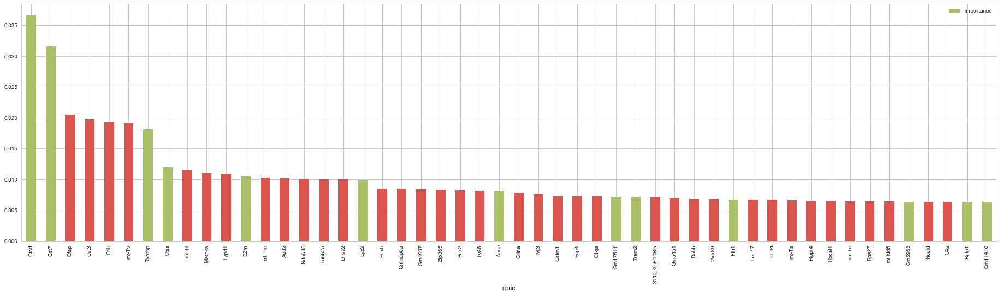

In [425]:
plot_important_genes(CX_KI_important_genes_df)

/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


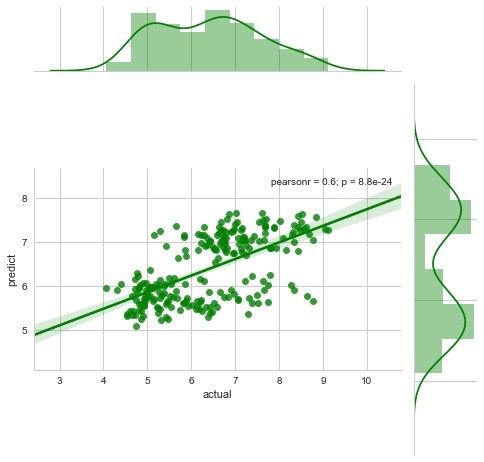

In [364]:
plot_test_predictions(CX_KI_pipeline, CX_KI_X_test[CX_KI_boruta_genes], CX_KI_y_test)

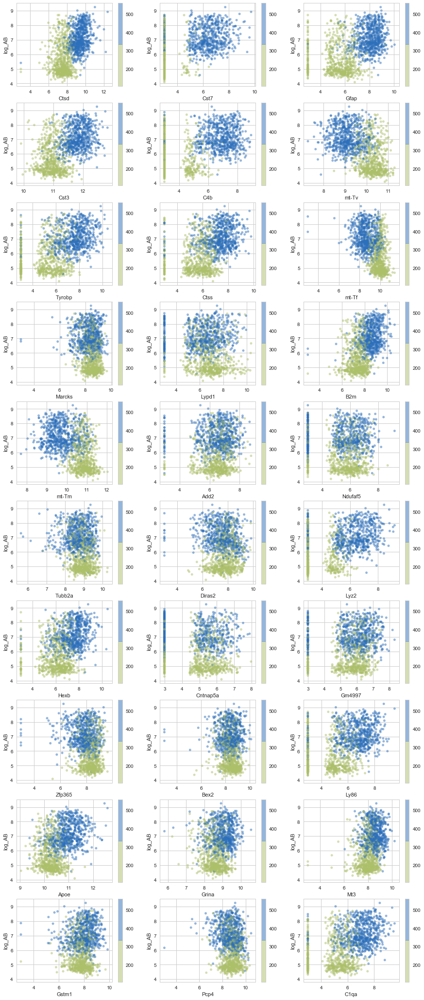

In [446]:
plot_expression_vs_log_AB(CX_KI_important_genes_df, CX_KI_X_train, CX_KI_y_train)

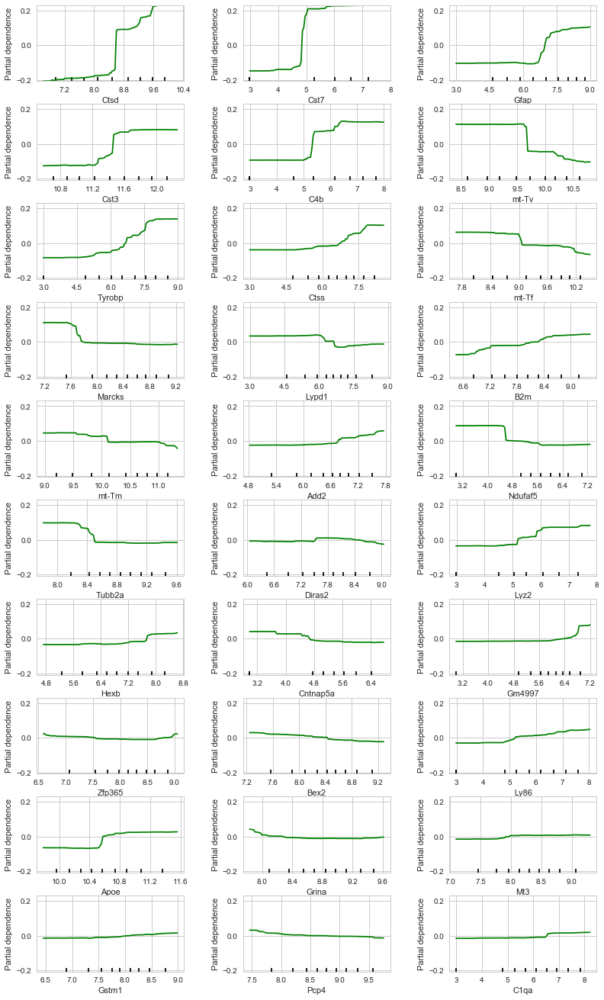

In [311]:
plot_pdp(CX_KI_pipeline, CX_KI_X_train, top=30)

---

# CX (KI + WT)

In [537]:
(CX_X_train, CX_y_train), (CX_X_test, CX_y_test) = make_datasets(full_df_clean, 'CX')

In [538]:
%%time
CX_pipeline = fit_pipeline(CX_X_train[gene_columns].as_matrix(), 
                           CX_y_train.values.ravel())

stopped after rounds: 997
CPU times: user 6h 13min 34s, sys: 4min 33s, total: 6h 18min 8s
Wall time: 19min 47s


In [545]:
CX_boruta_genes, CX_important_genes_df = important_genes(CX_pipeline)

In [546]:
(len(CX_boruta_genes), len(CX_important_genes_df))

(673, 673)

In [600]:
print(intersect_dam_genes(CX_boruta_genes))

Anxa3	 Apoe	 Atp1a3	 Atp5j2	 Atp6v1c1	 B2m	 Cck	 Ccl3	 Ccl6	 Cd52	 Cd63	 Cd68	 Cd74	 Cd9	 Clec7a	 Cox4i1	 Cox6a1	 Cox7a2l	 Cox8a	 Cst7	 Ctsa	 Ctsb	 Ctsd	 Ctsl	 Ctss	 Ctsz	 Eef1a1	 Eef2	 Fabp5	 Fau	 Fcer1g	 Fth1	 Ftl1	 Gm10036	 Gm10136	 Gm10269	 Gm10275	 Gm10443	 Gm10925	 Gm11410	 Gm11942	 Gm13226	 Gm13340	 Gm14303	 Gm15427	 Gm15590	 Gm15772	 Gm17511	 Gm3511	 Gm5963	 Gm6030	 Gm6977	 Gm7331	 Gm7363	 Gm7536	 Gm8129	 Gm9396	 Gm9493	 Gm9843	 Gnas	 Got1	 Gpnmb	 Grn	 Gusb	 H2-Ab1	 H2-D1	 H2-K1	 Hexa	 Hint1	 Itgax	 Kif1a	 Lgals3bp	 Lyz1	 Lyz2	 Man2b1	 Mpeg1	 Naca	 Ndufa1	 Ndufa6	 Npc2	 Pgk1	 Rpl10	 Rpl11	 Rpl12	 Rpl13	 Rpl17-ps5	 Rpl18a	 Rpl22	 Rpl22l1	 Rpl23	 Rpl27a	 Rpl28-ps1	 Rpl3	 Rpl32	 Rpl34-ps1	 Rpl35	 Rpl35a	 Rpl37	 Rpl37a	 Rpl38	 Rpl38-ps2	 Rpl8	 Rpl9-ps6	 Rplp0	 Rplp1	 Rplp2	 Rps10	 Rps11	 Rps12	 Rps14	 Rps15	 Rps15a	 Rps16	 Rps18	 Rps19	 Rps19-ps7	 Rps20	 Rps21	 Rps24-ps3	 Rps27a	 Rps28	 Rps3	 Rps4x	 Rps5	 Rps8	 Rps9	 Scd2	 Serpine2	 Spp1	 Syngr1	 Timp2	 Tmem176a	 Tpi1	 Tpt1	 Trem2	

In [548]:
CX_important_genes_df.to_csv(results_wd + 'CX_important_genes.tsv', sep='\t', index=None)

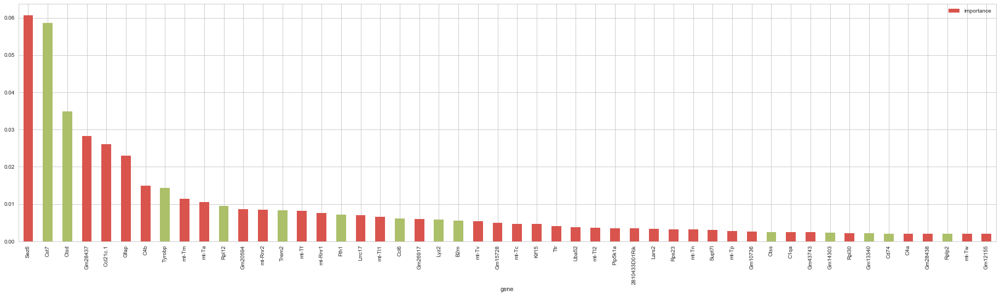

In [549]:
plot_important_genes(CX_important_genes_df)

/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


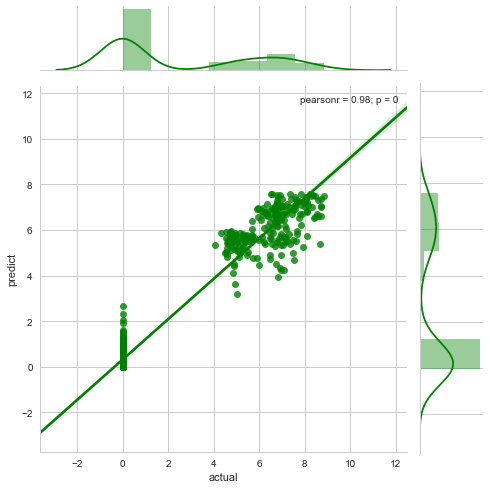

In [550]:
plot_test_predictions(CX_pipeline, CX_X_test[CX_boruta_genes], CX_y_test)

/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


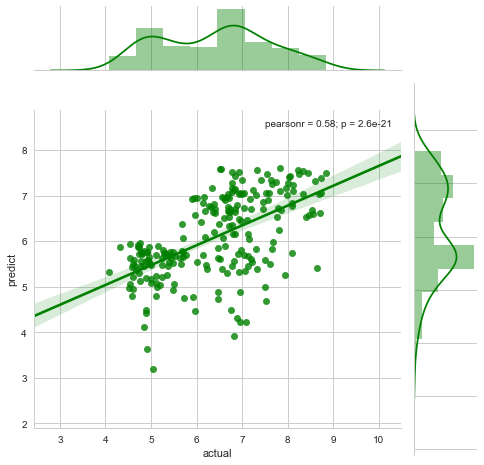

In [557]:
plot_test_predictions(CX_pipeline, CX_X_test[CX_X_test['GT'] == 'KI'][CX_boruta_genes], CX_y_test[CX_X_test['GT'] == 'KI'])

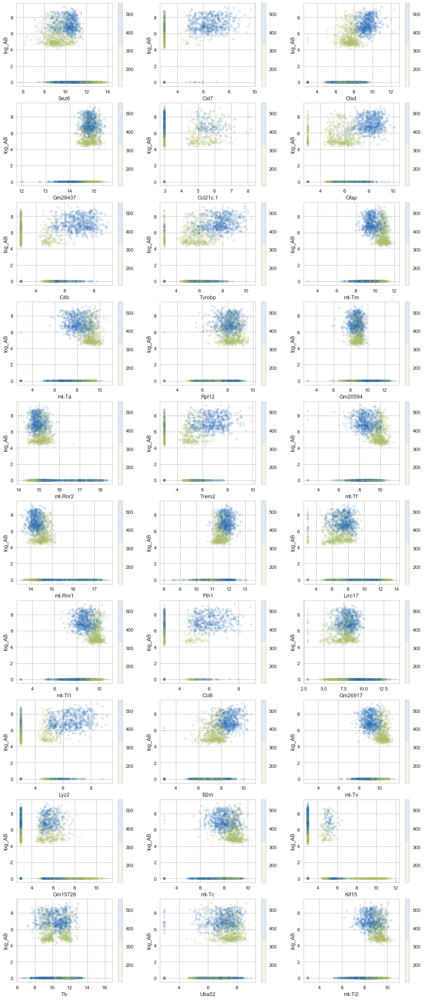

In [574]:
plot_expression_vs_log_AB(CX_important_genes_df, CX_X_train, CX_y_train, alpha=0.15)

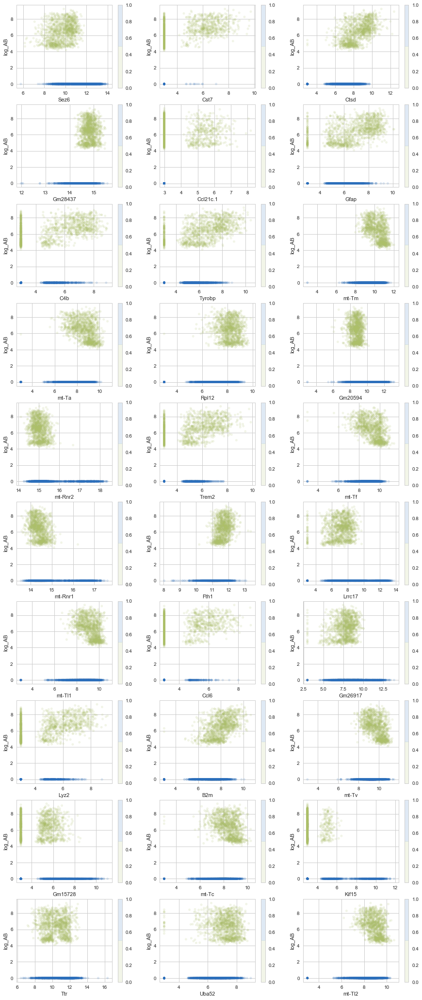

In [573]:
plot_expression_vs_log_AB(CX_important_genes_df, CX_X_train, CX_y_train, alpha=0.15, color_col='GT')

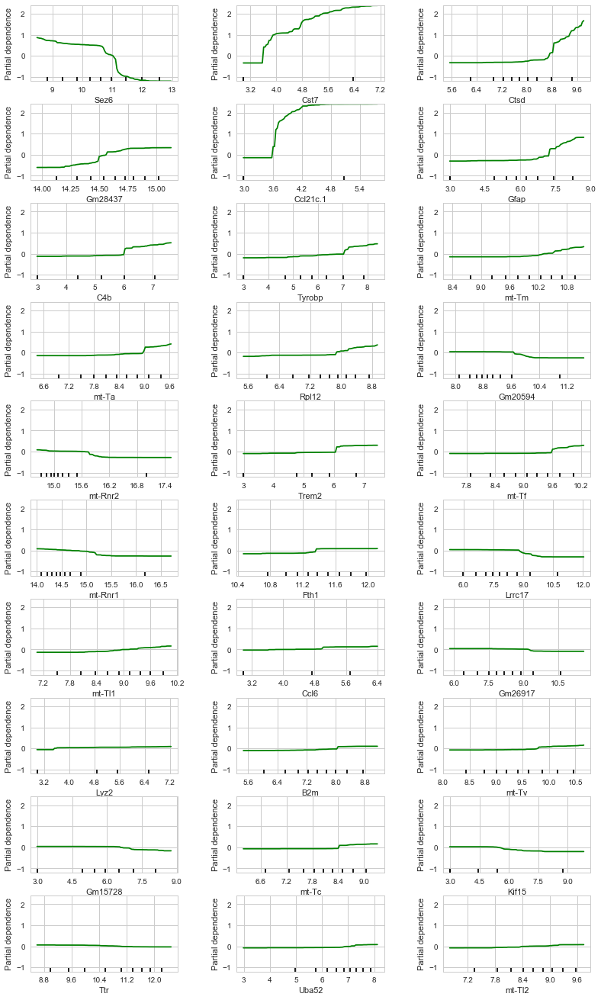

In [552]:
plot_pdp(CX_pipeline, CX_X_train, top=30)

---

---

---

# **BS (KI only)**

In [312]:
(BS_KI_X_train, BS_KI_y_train), (BS_KI_X_test, BS_KI_y_test) = make_datasets(full_df_clean, 'BS', 'KI')

In [ ]:
%%time
BS_KI_pipeline = fit_pipeline(BS_KI_X_train[gene_columns].as_matrix(), 
                              BS_KI_y_train.values.ravel())

In [314]:
BS_KI_boruta_genes, BS_KI_important_genes_df = important_genes(BS_KI_pipeline)

In [589]:
len(set.intersection(set(BS_KI_boruta_genes), set(BS_boruta_genes)))

101

In [453]:
(len(BS_KI_boruta_genes), len(BS_KI_important_genes_df))

(149, 149)

In [601]:
print(intersect_dam_genes(BS_KI_boruta_genes))

Apoe	 B2m	 Ccl6	 Cd52	 Cd68	 Cd74	 Cd9	 Clec7a	 Cox4i1	 Cst7	 Ctsa	 Ctsb	 Ctsd	 Ctss	 Ctsz	 Fcer1g	 Fth1	 Ftl1	 Fxyd6	 Gm10059	 Gm11410	 Gm13341	 Gm3511	 Gpnmb	 Grn	 H2-D1	 Hexa	 Itgax	 Lyz2	 Mpeg1	 Rpl22l1	 Spp1	 Trem2	 Tyrobp


In [317]:
BS_KI_important_genes_df.to_csv(results_wd + 'BS_KI_important_genes.tsv', sep='\t', index=None)

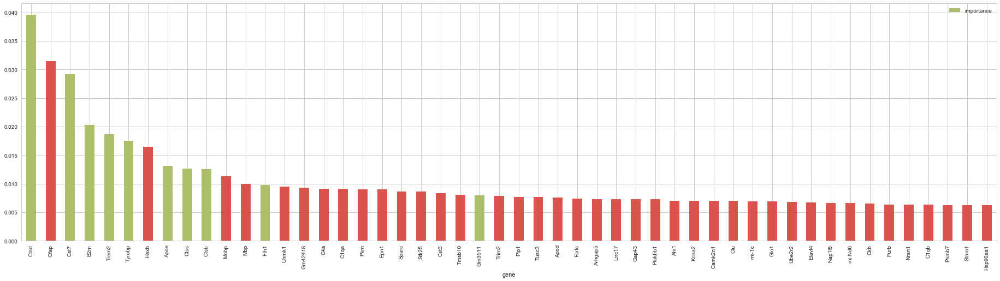

In [420]:
plot_important_genes(BS_KI_important_genes_df)

/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


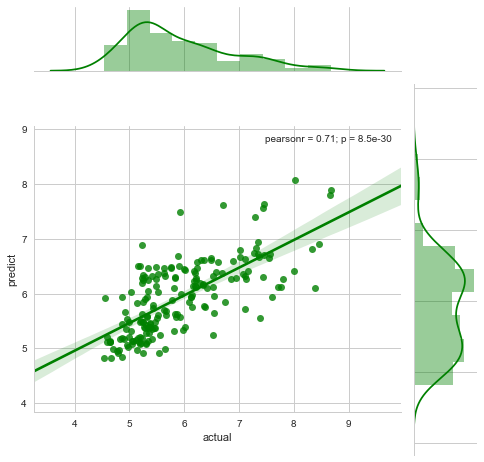

In [421]:
plot_test_predictions(BS_KI_pipeline, BS_KI_X_test[BS_KI_boruta_genes], BS_KI_y_test)

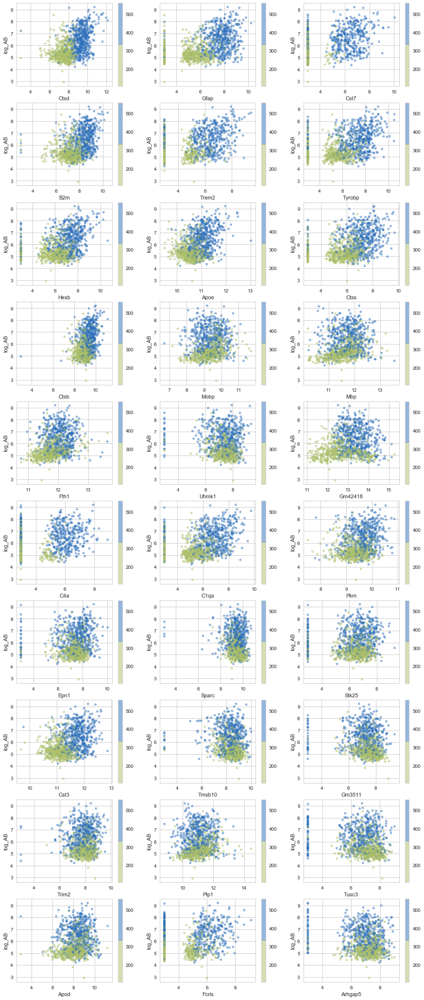

In [447]:
plot_expression_vs_log_AB(BS_KI_important_genes_df, BS_KI_X_train, BS_KI_y_train)

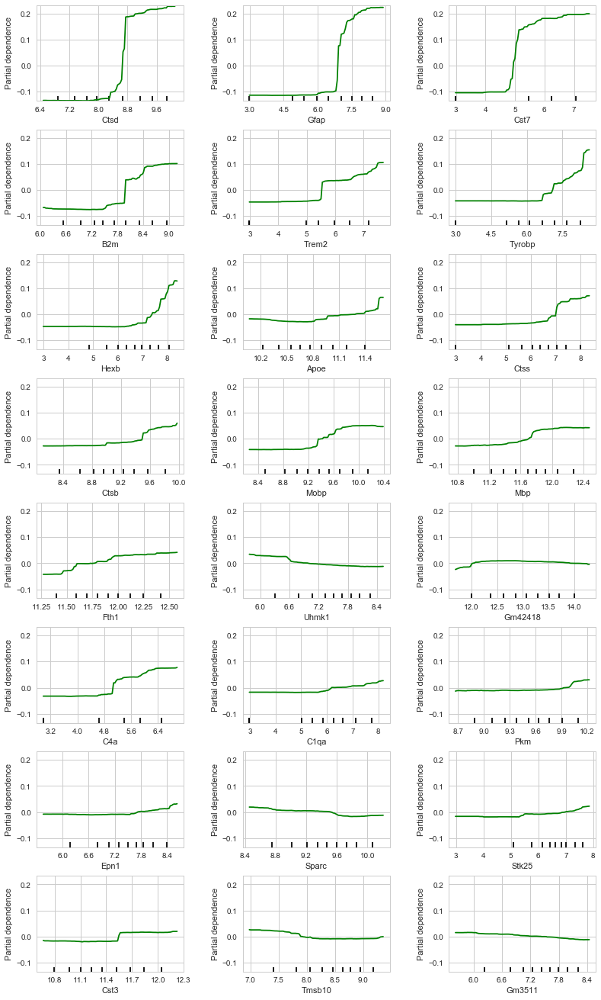

In [320]:
plot_pdp(BS_KI_pipeline, BS_KI_X_train)

---

# **BS (KI + WT)**

In [558]:
(BS_X_train, BS_y_train), (BS_X_test, BS_y_test) = make_datasets(full_df_clean, 'BS')

In [559]:
%%time
BS_pipeline = fit_pipeline(BS_X_train[gene_columns].as_matrix(), 
                           BS_y_train.values.ravel())

stopped after rounds: 1119
CPU times: user 3h 58min 56s, sys: 3min 30s, total: 4h 2min 26s
Wall time: 13min 22s


In [560]:
BS_boruta_genes, BS_important_genes_df = important_genes(BS_pipeline)

In [561]:
(len(BS_boruta_genes), len(BS_important_genes_df))

(543, 543)

In [602]:
print(intersect_dam_genes(BS_boruta_genes))

Apoe	 Atox1	 Atp5j2	 B2m	 Ccl3	 Ccl6	 Cd52	 Cd63	 Cd68	 Cd74	 Cd9	 Clec7a	 Cox6a1	 Cox8a	 Cst7	 Ctsa	 Ctsb	 Ctsd	 Ctsl	 Ctss	 Ctsz	 Eef1a1	 Eef2	 Fabp5	 Fau	 Fcer1g	 Fth1	 Ftl1	 Gm10136	 Gm10275	 Gm10443	 Gm10925	 Gm11410	 Gm13226	 Gm13340	 Gm13341	 Gm13456	 Gm14303	 Gm15427	 Gm15590	 Gm3511	 Gm5963	 Gm6023	 Gm6030	 Gm6977	 Gm7331	 Gm7363	 Gm7536	 Gm8129	 Gm9396	 Gm9493	 Gnas	 Got1	 Gpnmb	 Grn	 H2-D1	 Hexa	 Itgax	 Lyz1	 Lyz2	 Mpeg1	 Ndufa1	 Ndufa6	 Npc2	 Rpl10	 Rpl11	 Rpl12	 Rpl13	 Rpl22	 Rpl23	 Rpl27a	 Rpl28-ps1	 Rpl3	 Rpl32	 Rpl34-ps1	 Rpl35a	 Rpl37	 Rpl37a	 Rpl38	 Rpl38-ps2	 Rpl8	 Rpl9-ps6	 Rplp0	 Rplp1	 Rplp2	 Rps10	 Rps11	 Rps12	 Rps14	 Rps15	 Rps15a	 Rps16	 Rps18	 Rps20	 Rps21	 Rps24-ps3	 Rps25-ps1	 Rps27a	 Rps28	 Rps4x	 Rps8	 Rps9	 Scd2	 Spp1	 Syngr1	 Tpi1	 Tpt1	 Trem2	 Tyrobp


In [563]:
BS_important_genes_df.to_csv(results_wd + 'BS_important_genes.tsv', sep='\t', index=None)

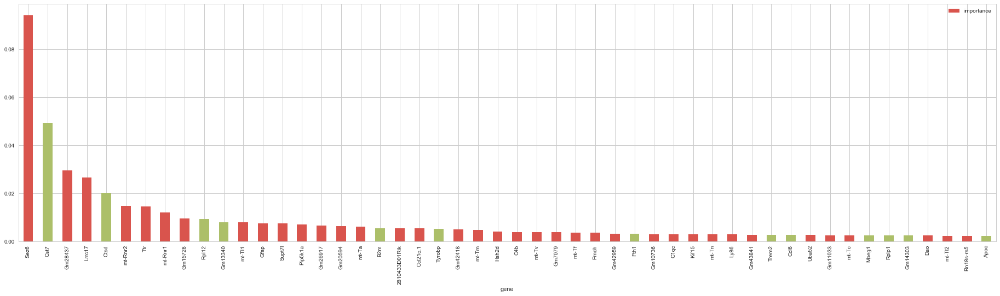

In [564]:
plot_important_genes(BS_important_genes_df)

/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


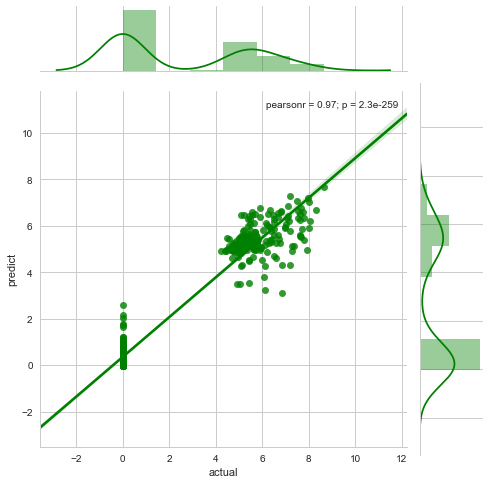

In [565]:
plot_test_predictions(BS_pipeline, BS_X_test[BS_boruta_genes], BS_y_test)

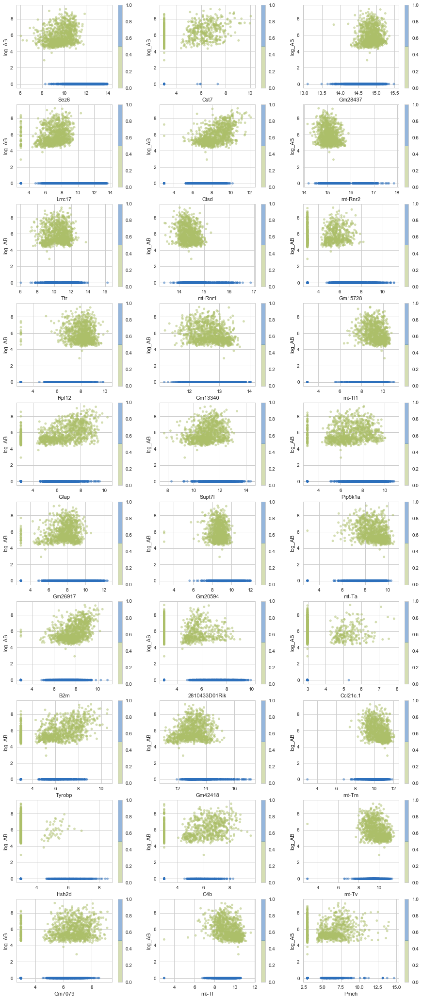

In [579]:
plot_expression_vs_log_AB(BS_important_genes_df, BS_X_train, BS_y_train, color_col='GT')

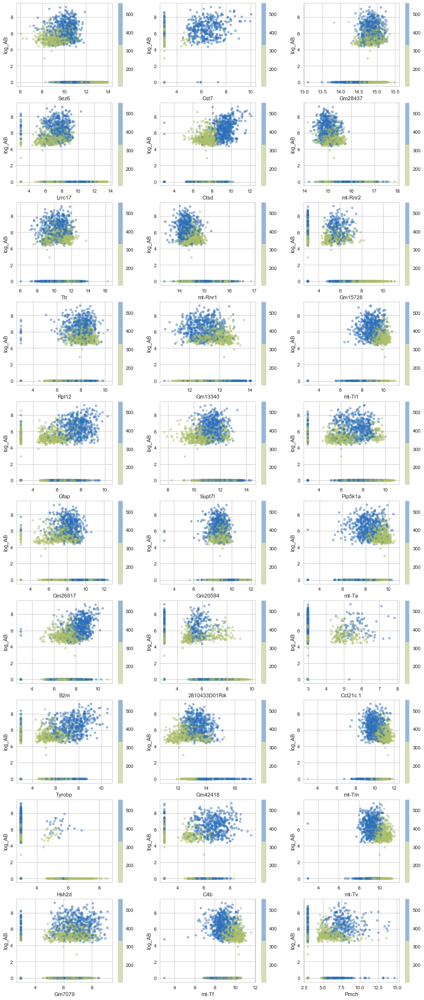

In [566]:
plot_expression_vs_log_AB(BS_important_genes_df, BS_X_train, BS_y_train)

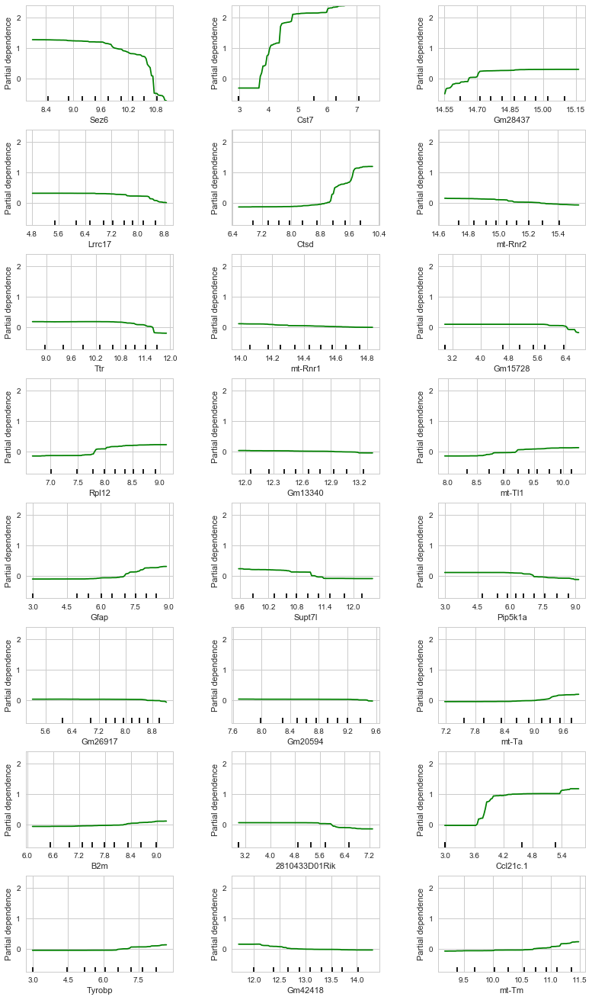

In [585]:
plot_pdp(BS_pipeline, BS_X_train[BS_X_train.GT == 'KI'])

---

---

---

# **HP (KI only)**

In [321]:
(HP_KI_X_train, HP_KI_y_train), (HP_KI_X_test, HP_KI_y_test) = make_datasets(full_df_clean, 'HP', 'KI')

In [ ]:
%%time
HP_KI_pipeline = fit_pipeline(HP_KI_X_train[gene_columns].as_matrix(), 
                              HP_KI_y_train.values.ravel())

In [323]:
HP_KI_boruta_genes, HP_KI_important_genes_df = important_genes(HP_KI_pipeline)

In [452]:
(len(HP_KI_boruta_genes), len(HP_KI_important_genes_df))

(84, 84)

In [603]:
print(intersect_dam_genes(HP_KI_boruta_genes))

Apoe	 B2m	 Ccl6	 Cd52	 Cd68	 Cd74	 Cd9	 Clec7a	 Cst7	 Ctsb	 Ctsd	 Ctss	 Ctsz	 Gm13340	 H2-D1	 H2-K1	 Hexa	 Itgax	 Lgals3bp	 Lyz2	 Man2b1	 Mpeg1	 Pebp1	 Pgk1	 Syngr1	 Trem2	 Tyrobp


In [325]:
HP_KI_important_genes_df.to_csv(results_wd + 'HP_KI_important_genes.tsv', sep='\t', index=None)

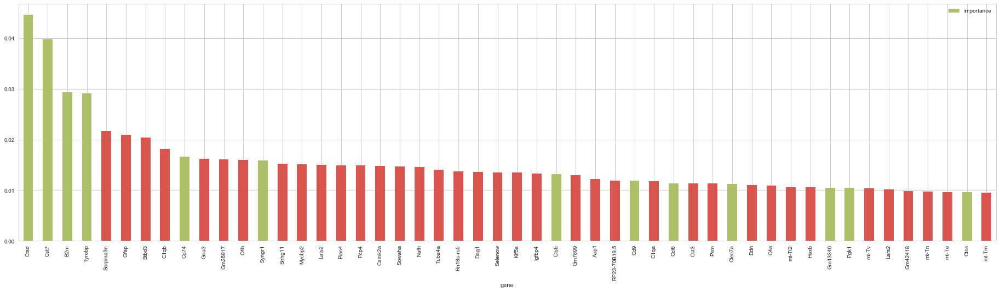

In [422]:
plot_important_genes(HP_KI_important_genes_df)

/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


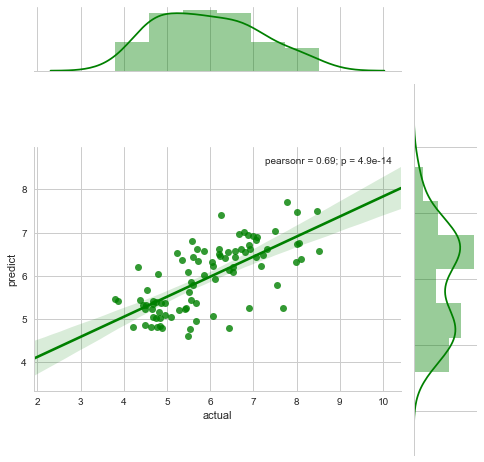

In [366]:
plot_test_predictions(HP_KI_pipeline, HP_KI_X_test[HP_KI_boruta_genes], HP_KI_y_test)

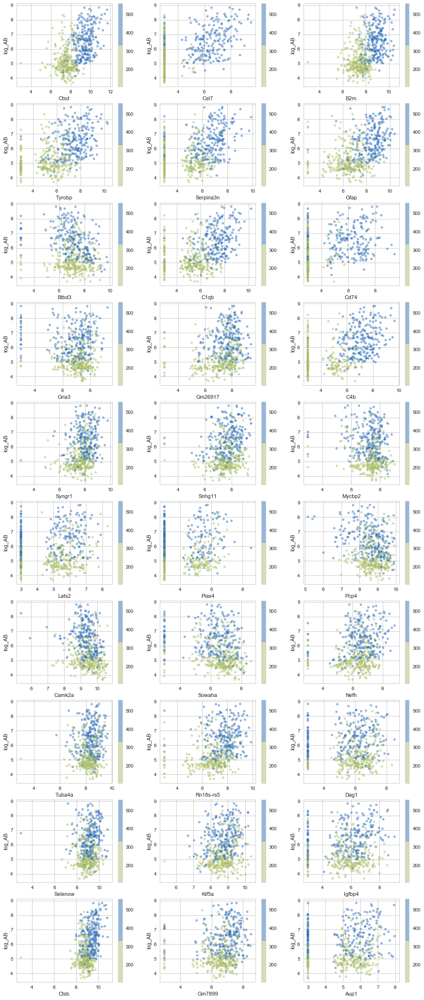

In [455]:
plot_expression_vs_log_AB(HP_KI_important_genes_df, HP_KI_X_train, HP_KI_y_train)

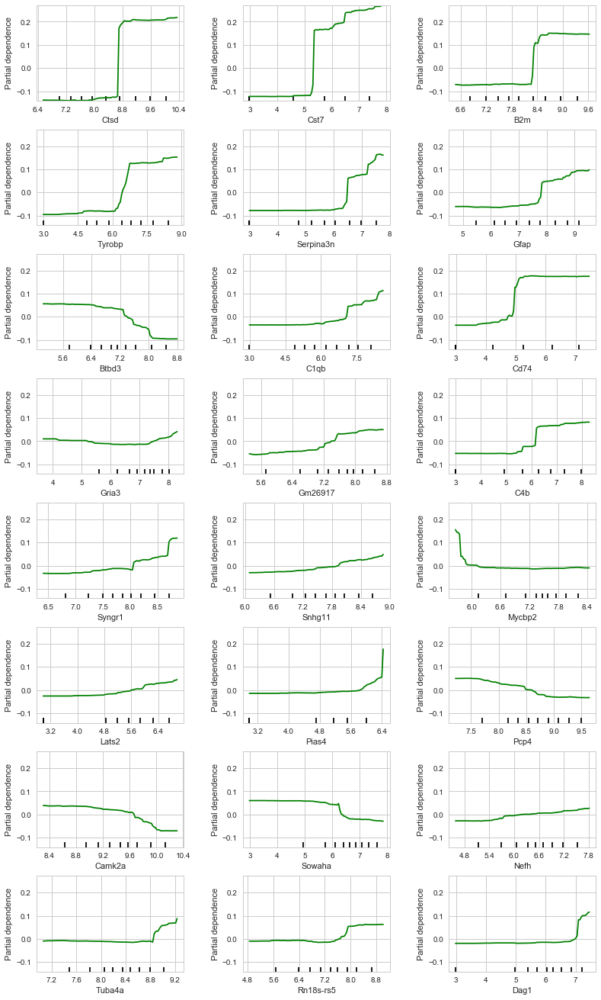

In [328]:
plot_pdp(HP_KI_pipeline, HP_KI_X_train)

---

# ALL level 01 spots (KI only)

In [329]:
(ALL_KI_X_train, ALL_KI_y_train), (ALL_KI_X_test, ALL_KI_y_test) = make_datasets(full_df_clean, 
                                                                                 level_01_region=None, 
                                                                                 genotype='KI')

In [330]:
%%time
ALL_KI_pipeline = fit_pipeline(ALL_KI_X_train[gene_columns].as_matrix(), 
                               ALL_KI_y_train.values.ravel())

stopped after rounds: 544
CPU times: user 5h 38min 20s, sys: 4min 52s, total: 5h 43min 13s
Wall time: 13min 5s


In [333]:
ALL_KI_boruta_genes, ALL_KI_important_genes_df = important_genes(ALL_KI_pipeline)

TODO pickle the models in the pipeline -> load them later

In [451]:
(len(ALL_KI_boruta_genes), len(ALL_KI_important_genes_df))

(231, 231)

In [604]:
print(intersect_dam_genes(ALL_KI_boruta_genes))

Apoe	 B2m	 Ccl6	 Cd52	 Cd68	 Cd74	 Cd9	 Clec7a	 Cox4i1	 Cst7	 Ctsa	 Ctsb	 Ctsd	 Ctsl	 Ctss	 Ctsz	 Fcer1g	 Fth1	 Ftl1	 Gm10059	 Gm10925	 Gm11410	 Gm13340	 Gm17511	 Gpnmb	 Grn	 H2-D1	 Hexa	 Itgax	 Lgals3bp	 Lpl	 Lyz1	 Lyz2	 Mamdc2	 Man2b1	 Mpeg1	 Npc2	 Pea15a	 Pld3	 Rpl22l1	 Rpl32	 Rplp1	 Scd2	 Spp1	 Syngr1	 Timp2	 Tpi1	 Trem2	 Tyrobp	 Uqcr11


In [337]:
ALL_KI_important_genes_df.to_csv(results_wd + 'ALL_KI_important_genes.tsv', sep='\t', index=None)

In [338]:
# ALL_KI_important_genes_df = pd.read_csv(results_wd + 'ALL_KI_important_genes.tsv', sep='\t')

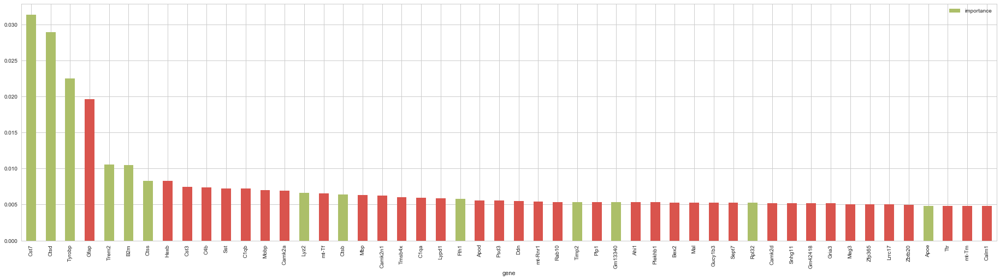

In [418]:
plot_important_genes(ALL_KI_important_genes_df)

/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


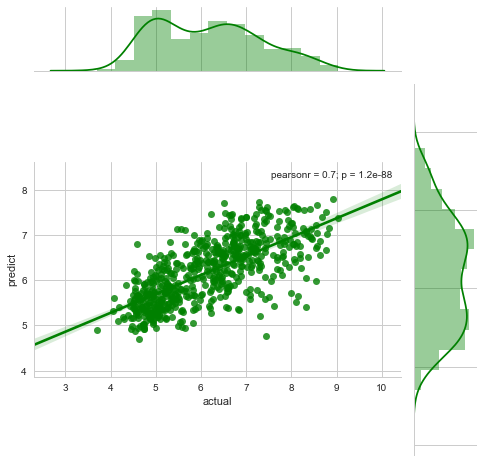

In [367]:
plot_test_predictions(ALL_KI_pipeline, ALL_KI_X_test[ALL_KI_boruta_genes], ALL_KI_y_test)

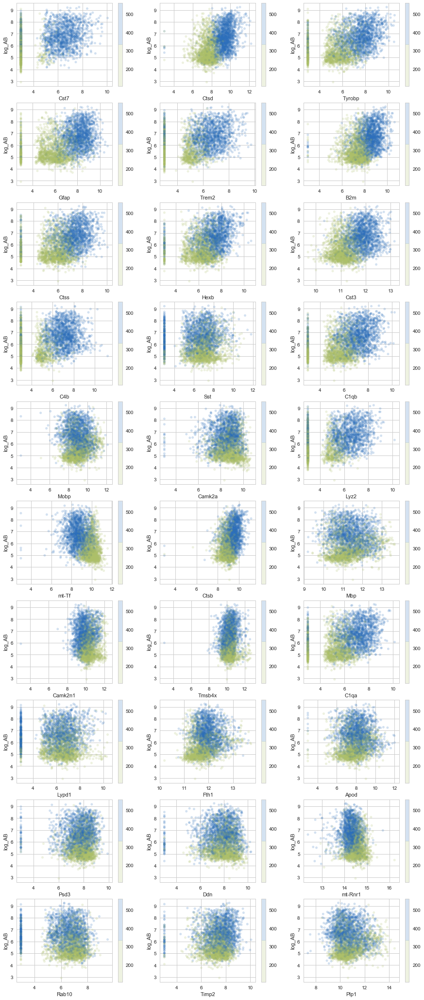

In [449]:
plot_expression_vs_log_AB(ALL_KI_important_genes_df, ALL_KI_X_train, ALL_KI_y_train, alpha=0.2)

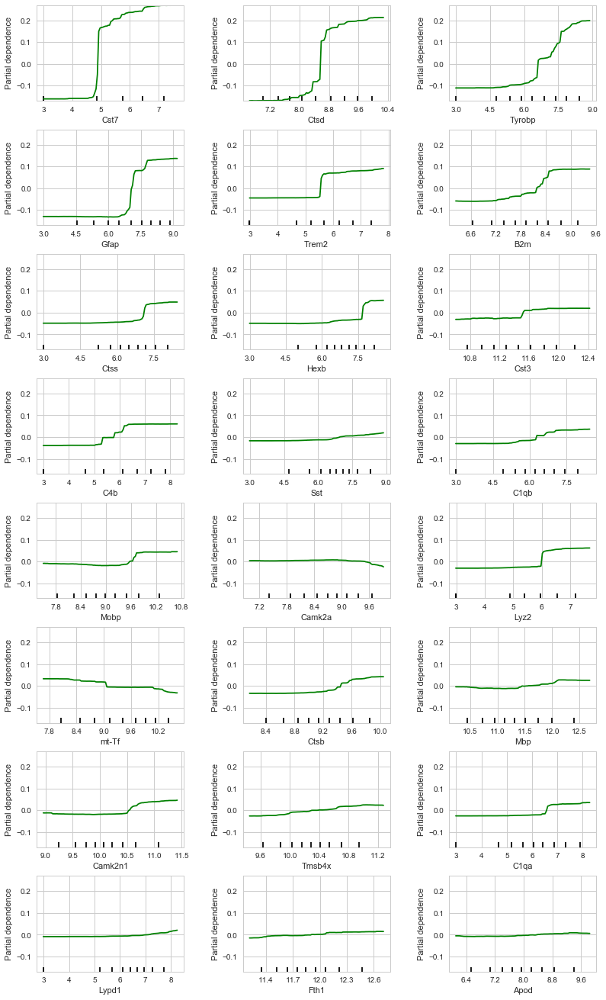

In [356]:
plot_pdp(ALL_KI_pipeline, ALL_KI_X_train)

--- 
# Venn doodles

In [533]:
def dam(set_genes, dam_genes=DAM_genes):
    return set.intersection(set_genes, set(dam_genes))

In [606]:
from matplotlib_venn import venn3, venn2

In [605]:
ALL_set = set(ALL_KI_boruta_genes)

CX_set = set(CX_KI_boruta_genes)
BS_set = set(BS_KI_boruta_genes)
HP_set = set(HP_KI_boruta_genes)

UNION_set = set.union(CX_set, BS_set, HP_set)

CX_BS_HP_set = sorted(list(set.intersection(CX_set, BS_set, HP_set)))
CX_BS_HP_ALL_set = sorted(list(set.intersection(CX_set, BS_set, HP_set, ALL_set)))

CX_HP_only_set = sorted(list(set.difference(set.intersection(CX_set, HP_set), CX_BS_HP_set)))
CX_BS_only_set = sorted(list(set.difference(set.intersection(CX_set, BS_set), CX_BS_HP_set)))
HP_BS_only_set = sorted(list(set.difference(set.intersection(HP_set, BS_set), CX_BS_HP_set)))

CX_only_set = sorted(list(set.difference(CX_set, set.union(HP_set, BS_set))))
BS_only_set = sorted(list(set.difference(BS_set, set.union(HP_set, CX_set))))
HP_only_set = sorted(list(set.difference(HP_set, set.union(BS_set, CX_set))))

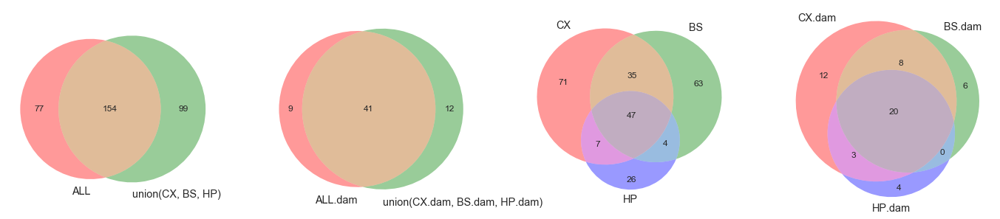

In [614]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(24,8))

axes = axs.flatten()

venn2([ALL_set, UNION_set], set_labels=('ALL', 'union(CX, BS, HP)'), ax=axes[0])
venn2([dam(ALL_set), dam(UNION_set)], set_labels=('ALL.dam', 'union(CX.dam, BS.dam, HP.dam)'), ax=axes[1])
venn3([CX_set, BS_set, HP_set], set_labels=('CX', 'BS', 'HP'), ax=axes[2])
venn3([dam(CX_set), dam(BS_set), dam(HP_set)], set_labels=('CX.dam', 'BS.dam', 'HP.dam'), ax=axes[3])

plt.show()

In [523]:
print('\t'.join(CX_BS_HP_set))

Apoe	B2m	C1qa	C1qb	C1qc	C4a	C4b	Ccl6	Cd52	Cd68	Cd74	Cd9	Clec7a	Cst3	Cst7	Ctsb	Ctsd	Ctss	Ctsz	Cyba	Fcrls	Gfap	Gm42418	H2-D1	Hexa	Hexb	Itgax	Laptm5	Ly86	Lyz2	Mpeg1	RP23-269H21.1	Rn18s-rs5	Serpina3n	Trem2	Trf	Tyrobp	mt-Ta	mt-Tc	mt-Te	mt-Tf	mt-Tl1	mt-Tl2	mt-Tm	mt-Tn	mt-Tp	mt-Tv


In [525]:
print('\t'.join(CX_BS_only_set))

Cd14	Celf4	Clu	Cox4i1	Csf1r	Ctsa	Dnm1	Eef1a2	Fcer1g	Fcgr3	Fth1	Gm11410	Gm12155	Gm20721	Gm7618	Gpnmb	Grina	Grn	Itgb5	Lag3	Lrrc17	Marcks	Pip5k1a	Plppr4	Psap	Purb	Sez6	Slc46a3	Spp1	Supt7l	mt-Atp8	mt-Nd1	mt-Nd6	mt-Rnr1	mt-Th


In [526]:
print('\t'.join(CX_HP_only_set))

Fcgr2b	Gm13340	Gm26917	H2-Aa	H2-K1	Lgals3bp	Pcp4


In [527]:
print('\t'.join(HP_BS_only_set))

Camk2n1	Nefh	Pkm	Scrt1


In [528]:
print('\t'.join(CX_only_set))

3110035E14Rik	AC149090.1	Add2	Anks1b	Atp6ap1	Bex2	Cd63	Cntnap5a	Cpne6	Ctsl	Diras2	Dohh	Fbxl16	Foxp2	Gda	Gm10073	Gm10269	Gm10800	Gm10801	Gm13464	Gm17511	Gm24601	Gm29216	Gm4997	Gm5244	Gm5451	Gm5575	Gm5963	Gm7808	Gm8326	Gstm1	Hpcal1	Ifi27	Klf9	Lamp2	Lypd1	Lyz1	Malat1	Mir703	Mt3	Ncald	Ndufaf5	Nme7	Npc2	Plek	Podxl2	Prkce	Rasgrp1	Rimbp3	Rnaset2a	Rora	Rpl21	Rpl37rt	Rplp1	Rps12-ps3	Rps27	Tpi1	Tubb2a	Wdr89	Zfp365	mt-Co3	mt-Nd2	mt-Nd3	mt-Nd4	mt-Nd4l	mt-Nd5	mt-Tk	mt-Tq	mt-Tr	mt-Ts2	mt-Tw


In [529]:
print('\t'.join(BS_only_set))

6330403K07Rik	Ahi1	Ankrd13c	Apod	Arhgap5	B630019K06Rik	Basp1	Cbln2	Cbln4	Ckb	Cplx1	Ctxn3	Elavl4	Eno2	Epn1	Fgf13	Ftl1	Fxyd6	Gap43	Glo1	Gm10059	Gm13341	Gm3511	Gprasp1	Gprasp2	Hcn2	Hsp90aa1	Kcna2	Ldhb	Lgi3	Lmo4	Mbp	Mobp	Nap1l5	Ndn	Nrsn1	Nsmf	Olfml3	Pgrmc1	Plekhb1	Plp1	Psmb7	Pvalb	Qdpr	Resp18	Rpl22l1	Rtn1	S100b	Scn1b	Sparc	Stk25	Stmn1	Tceal1	Tmsb10	Trim2	Tusc3	Ube2r2	Uhmk1	Vgf	Vsir	Zcchc12	Zdbf2	mt-Co2


In [530]:
print('\t'.join(HP_only_set))

Aup1	Btbd3	Camk2a	Dag1	Ddn	Gfm2	Gm7899	Gria3	Hspa8	Igfbp4	Kif5a	Lars2	Lats2	Man2b1	Mycbp2	Pebp1	Pgk1	Pias4	RP23-70B19.5	Selenow	Snhg11	Sowaha	Srgn	Syngr1	Tuba4a	Zfp30


---

# Keras doodles

## 01 Sequential model: regression to predict log_AB plaque load

In [84]:
ALL_KI_boruta_genes_df = pd.read_csv(results_wd + 'ALL_KI_important_genes.tsv', sep='\t')

In [85]:
ALL_KI_boruta_genes = list(ALL_KI_boruta_genes_df['gene'])

In [86]:
from keras import models
from keras import layers

from keras import regularizers
from keras.datasets import mnist
from keras.utils import to_categorical

import matplotlib.pyplot as plt

Using TensorFlow backend.


In [87]:
nr_inputs = len(ALL_KI_boruta_genes)
nr_inputs

302

In [88]:
splitter = ShuffleSplit(n_splits=10, test_size=0.15, random_state=42)

In [89]:
train_idx, val_idx = next(splitter.split(ALL_KI_X_train))

In [90]:
ALL_KI_X_train.shape

(3827, 46766)

In [93]:
ALL_KI_X_full_train = ALL_KI_X_train[ALL_KI_boruta_genes].iloc[train_idx].astype('float16')

ALL_KI_X_partial_train = ALL_KI_X_train[ALL_KI_boruta_genes].iloc[train_idx]
ALL_KI_y_partial_train = ALL_KI_y_train.iloc[train_idx]

ALL_KI_X_val = ALL_KI_X_train[ALL_KI_boruta_genes].iloc[val_idx]
ALL_KI_X_full_val = ALL_KI_X_train[ALL_KI_boruta_genes].iloc[val_idx].astype('float16')
ALL_KI_y_val = ALL_KI_y_train.iloc[val_idx]

In [94]:
slide_ID_by_age_df = df.groupby(['slide_ID', 'age_days']).size().reset_index().sort_values(by='age_days')
slide_IDs_by_age = slides_ID_by_age_df['slide_ID']

NameError: name 'df' is not defined

In [ ]:
slide_ID_by_age_df

In [ ]:
gene = 'mt-Rnr1'

df = full_df[full_df['GT'] == 'KI'][[gene, 'log_AB', 'Level_01', 'age_days', 'slide_ID']].copy()
df['Level_01'] = df['Level_01'].astype('category', copy=False)

In [ ]:
f, axes = plt.subplots(nrows=10, ncols=1, figsize=(3, 39))

for idx, slide in enumerate(slide_IDs_by_age):
    df.plot.scatter(x=gene, y='log_AB', c=(df['slide_ID'] == slide).astype(int), alpha=0.2, cmap='viridis_r', ax=axes[idx])
    axes[idx].legend([slide])
    
plt.savefig('{}_to_log_AB_by_slide_ID.png'.format(gene))
plt.show()

In [95]:
class controlled():
    
    def __init__(self, network_factory_fn):
        self.factory = network_factory_fn
    
    def __enter__(self):
        return self.factory()
    
    def __exit__(self, type, network, traceback):
        if network:
            del network
        gc.collect()

In [96]:
def make_network():
    network = models.Sequential()
    network.add(layers.Dense(64, activation='elu', input_shape=(ALL_KI_X_partial_train.shape[1], )))
    network.add(layers.Dense(64, activation='elu'))
    network.add(layers.Dense(64, activation='elu'))
    network.add(layers.Dense(1))

    network.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return network

In [97]:
def smooth_curve(points, factor=0.9):
    smoothed_points=[]
    
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]            
            smoothed_points.append(previous * factor + point * (1-factor))
        else:
            smoothed_points.append(point)
            
    return smoothed_points

In [98]:
def make_network_reg_l1():
    network = models.Sequential()
    network.add(layers.Dense(64, activation='elu', input_shape=(ALL_KI_X_partial_train.shape[1], ), kernel_regularizer=regularizers.l1(0.01)))    
    network.add(layers.Dense(64, activation='elu', kernel_regularizer=regularizers.l1(0.01)))
    network.add(layers.Dense(64, activation='elu', kernel_regularizer=regularizers.l1(0.01)))
    network.add(layers.Dense(1))

    network.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return network

In [99]:
def make_network_reg_l2():
    n_units=16
    act_fn='elu'
    drop_frac=0.2
    
    network = models.Sequential()
    network.add(layers.Dense(n_units, activation=act_fn, input_shape=(ALL_KI_X_partial_train.shape[1], ), kernel_regularizer=regularizers.l2(0.1)))
    network.add(layers.Dropout(drop_frac))
    network.add(layers.Dense(n_units, activation=act_fn, kernel_regularizer=regularizers.l2(0.1)))
    network.add(layers.Dropout(drop_frac))
    network.add(layers.Dense(n_units, activation=act_fn, kernel_regularizer=regularizers.l2(0.1)))
    network.add(layers.Dropout(drop_frac))
    network.add(layers.Dense(n_units, activation=act_fn, kernel_regularizer=regularizers.l2(0.1)))
    network.add(layers.Dropout(drop_frac))
    network.add(layers.Dense(1))

    network.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    print(network.summary())
    
    return network

In [100]:
%%time
try:
    del network_01
except:
    pass
    
gc.collect()

network_01 = make_network_reg_l2()

n_epochs = 400

history = network_01.fit(ALL_KI_X_partial_train,
                         ALL_KI_y_partial_train,
                         epochs=n_epochs,
                         batch_size=128,
                         verbose=0,
                         validation_data=(ALL_KI_X_val, ALL_KI_y_val))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 16)                4848      
_________________________________________________________________
dropout_1 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 16)                272       
_________________________________________________________________
dropout_2 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 16)                272       
_________________________________________________________________
dropout_3 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 16)                272       
__________

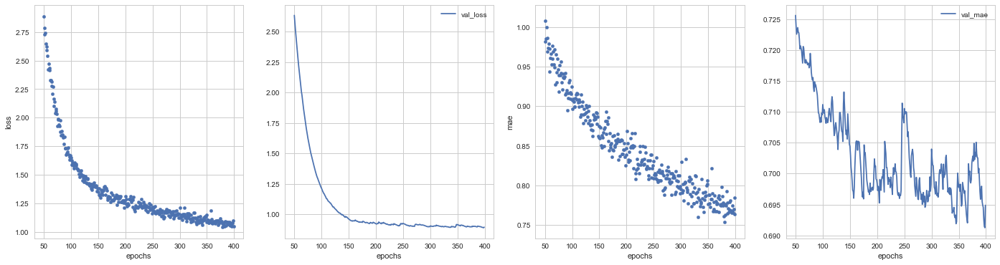

/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/home/tmo/work/batiskav/installs/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


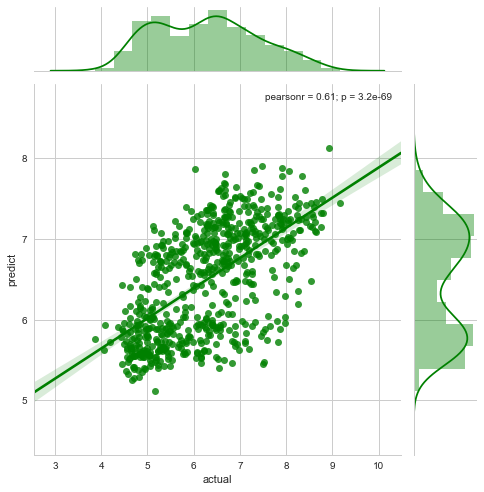

In [101]:
f, axes = plt.subplots(1, 4, figsize=(24,6))
skip=50
epochs = list(range(0, n_epochs))[skip:]
pd.DataFrame({'loss': history.history['loss'][skip:], 'epochs': epochs}).plot.scatter(x='epochs', y='loss', ax=axes[0])
pd.DataFrame({'val_loss': smooth_curve(history.history['val_loss'])[skip:], 'epochs': epochs}).plot(x='epochs', y='val_loss', ax=axes[1])
pd.DataFrame({'mae': history.history['mean_absolute_error'][skip:], 'epochs': epochs}).plot.scatter(x='epochs', y='mae', ax=axes[2])
pd.DataFrame({'val_mae': smooth_curve(history.history['val_mean_absolute_error'])[skip:], 'epochs': epochs}).plot(x='epochs', y='val_mae', ax=axes[3])
plt.show()

predictions_df = pd.DataFrame({'predict': network_01.predict(ALL_KI_X_test[ALL_KI_boruta_genes]).ravel(), 'actual': ALL_KI_y_test})
sns.jointplot("actual", "predict", data=predictions_df, kind="reg", color="g", size=7)
plt.show()

## 02 Sequential model: classification to predict region

* 1 boruta region genes

## 03 Functional model: classification and regression combined

* combine boruta gene sets:
    * regression -> log_AB
    * classification -> GT
    * classification -> region
* trian combined model